This notebook will be merging the results of the Bertopic NLP notebook, as well as the Poster_Genre_Prediction notebook

# Setting up the merged df of BERTopic and posters to include extra features from other sections

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from torchvision import transforms
import torch
from torch.utils.data import DataLoader
from PIL import Image
from sklearn.model_selection import train_test_split
from torchvision.models import resnet50, ResNet50_Weights
import torch.nn as nn
import os
import time
from tqdm import tqdm
from scipy import stats

In [2]:
topics_df = pd.read_csv('movie_BERTopic_OHE_df.csv')

In [3]:
topics_df

,Release Year,Title,Topic,Probability,Bertopic_0,Bertopic_1,Bertopic_2,Bertopic_3,Bertopic_4,Bertopic_5,...,Bertopic_33,Bertopic_34,Bertopic_35,Bertopic_36,Bertopic_37,Bertopic_38,Bertopic_39,Bertopic_40,Bertopic_41,Bertopic_42
0,1901,Kansas Saloon Smashers,4,0.241017,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1905,The Night Before Christmas,39,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1906,Kathleen Mavourneen,30,0.465372,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1908,A Christmas Carol,39,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1909,The Lure of the Gown,11,0.352441,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18829,2013,Particle (film),1,0.385919,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18830,2014,Mandıra Filozofu,1,0.182294,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18831,2014,Winter Sleep,5,0.207084,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18832,2017,Olanlar Oldu,1,0.562993,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
topics_df.head(5)

,Release Year,Title,Topic,Probability,Bertopic_0,Bertopic_1,Bertopic_2,Bertopic_3,Bertopic_4,Bertopic_5,...,Bertopic_33,Bertopic_34,Bertopic_35,Bertopic_36,Bertopic_37,Bertopic_38,Bertopic_39,Bertopic_40,Bertopic_41,Bertopic_42
0,1901,Kansas Saloon Smashers,4,0.241017,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1905,The Night Before Christmas,39,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,1906,Kathleen Mavourneen,30,0.465372,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1908,A Christmas Carol,39,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1909,The Lure of the Gown,11,0.352441,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
posters_df = pd.read_csv('posters_df_mini.csv')

In [6]:
posters_df.head(5)

,Title,IMDB Score,Genre,Release Year,Poster_File_Path
0,Toy Story,8.3,Animation|Adventure|Comedy,1995,posters_images/0.jpg
1,Jumanji,6.9,Action|Adventure|Family,1995,posters_images/1.jpg
2,Grumpier Old Men,6.6,Comedy|Romance,1995,posters_images/2.jpg
3,Waiting to Exhale,5.7,Comedy|Drama|Romance,1995,posters_images/3.jpg
4,Father of the Bride Part II,5.9,Comedy|Family|Romance,1995,posters_images/4.jpg


In [7]:
merged_df = topics_df.merge(posters_df, on='Title', how='inner')

In [8]:
merged_df.shape

(8215, 51)

In [9]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8215 entries, 0 to 8214
Data columns (total 51 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Release Year_x    8215 non-null   int64  
 1   Title             8215 non-null   object 
 2   Topic             8215 non-null   int64  
 3   Probability       8215 non-null   float64
 4   Bertopic_0        8215 non-null   float64
 5   Bertopic_1        8215 non-null   float64
 6   Bertopic_2        8215 non-null   float64
 7   Bertopic_3        8215 non-null   float64
 8   Bertopic_4        8215 non-null   float64
 9   Bertopic_5        8215 non-null   float64
 10  Bertopic_6        8215 non-null   float64
 11  Bertopic_7        8215 non-null   float64
 12  Bertopic_8        8215 non-null   float64
 13  Bertopic_9        8215 non-null   float64
 14  Bertopic_10       8215 non-null   float64
 15  Bertopic_11       8215 non-null   float64
 16  Bertopic_12       8215 non-null   float64


# Poster preprocessing

In [10]:
merged_df.head(5)

,Release Year_x,Title,Topic,Probability,Bertopic_0,Bertopic_1,Bertopic_2,Bertopic_3,Bertopic_4,Bertopic_5,...,Bertopic_37,Bertopic_38,Bertopic_39,Bertopic_40,Bertopic_41,Bertopic_42,IMDB Score,Genre,Release Year_y,Poster_File_Path
0,1905,The Night Before Christmas,39,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,7.8,Comedy|Fantasy|Romance,1962,posters_images/28034.jpg
1,1905,The Night Before Christmas,39,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,6.1,Comedy|Family|Western,1994,posters_images/34877.jpg
2,1941,The Night Before Christmas,19,0.711894,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,7.8,Comedy|Fantasy|Romance,1962,posters_images/28034.jpg
3,1941,The Night Before Christmas,19,0.711894,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6.1,Comedy|Family|Western,1994,posters_images/34877.jpg
4,1908,A Christmas Carol,39,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,7.5,Drama|Family|Fantasy,1938,posters_images/1077.jpg


In [11]:
# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(), # Convert the image to PyTorch Tensor data type
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [12]:
class MergedDataset(torch.utils.data.Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        # specify the relevant columns
        self.relevant_cols = ['Bertopic_' + str(i) for i in range(43)]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.df.iloc[idx]['Poster_File_Path']
        image = Image.open(img_name).convert('RGB')

        if self.transform:
            image = self.transform(image)

        labels = self.df.loc[idx, self.relevant_cols].values
        labels = labels.astype('float32')
        labels = torch.tensor(labels).float()

        return image, labels, img_name

In [13]:
# Instantiate dataset
dataset = MergedDataset(merged_df, transform)

# Create a data loader
loader = DataLoader(dataset, batch_size=64, shuffle=True)

# Iterate over the loader to get batches of images
for i, batch in enumerate(loader):
    print(f"Processed batch {i}")

Processed batch 0
Processed batch 1
Processed batch 2
Processed batch 3
Processed batch 4
Processed batch 5
Processed batch 6
Processed batch 7
Processed batch 8
Processed batch 9
Processed batch 10
Processed batch 11
Processed batch 12
Processed batch 13
Processed batch 14
Processed batch 15
Processed batch 16
Processed batch 17
Processed batch 18
Processed batch 19
Processed batch 20
Processed batch 21
Processed batch 22
Processed batch 23
Processed batch 24
Processed batch 25
Processed batch 26
Processed batch 27
Processed batch 28
Processed batch 29
Processed batch 30
Processed batch 31
Processed batch 32
Processed batch 33
Processed batch 34
Processed batch 35
Processed batch 36
Processed batch 37
Processed batch 38
Processed batch 39
Processed batch 40
Processed batch 41
Processed batch 42
Processed batch 43
Processed batch 44
Processed batch 45
Processed batch 46
Processed batch 47
Processed batch 48
Processed batch 49
Processed batch 50
Processed batch 51
Processed batch 52
Pro

# Model creation

In [14]:
# Hard coding the amount of BERTopic topics, change accordingly for future modifications
num_topics = 43
train_df, temp_df = train_test_split(merged_df, test_size=0.3, random_state=1)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=1)

# Reset the index of the DataFrames
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# Instantiate datasets
train_dataset = MergedDataset(train_df, transform)
val_dataset = MergedDataset(val_df, transform)
test_dataset = MergedDataset(test_df, transform)

# Create the data loaders
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define Model
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)

num_ftrs = model.fc.in_features
# Replace the last layer to match the number of topics
model.fc = nn.Linear(num_ftrs, num_topics)

# Use Binary Cross-Entropy with Logits loss for multi-label classification
criterion = nn.BCEWithLogitsLoss()

# Use the Adam optimizer for adjusting the weights
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)


In [15]:
# Hard coding the amount of BERTopic topics, change accordingly for future modifications
num_topics = 43

In [16]:
train_df, temp_df = train_test_split(merged_df, test_size=0.3, random_state=1)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=1)

In [17]:
# Reset the index of the DataFrames
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# Instantiate datasets
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)


# Create the data loaders
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [18]:
# Define Model
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)

num_ftrs = model.fc.in_features
# Replace the last layer to match the number of topics
model.fc = nn.Linear(num_ftrs, num_topics)

# Use Binary Cross-Entropy with Logits loss for multi-label classification
criterion = nn.BCEWithLogitsLoss()

# Use the Adam optimizer for adjusting the weights
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

# Model Training

## For time constraints:
If you are running through this code in the future, please modify model_path in the next cell accordingly, than skip forward until the header 'Loads epoch 50, which was used for future testing'

If you wish to re-create my results, please load epoch 50 from the github, and skip the next few cells which take a long time (took me just under 20h).

In [19]:
# Path to save models
model_path = "~/Desktop/Brainstation/Capstone/capstone-repo-CSergiy/model_BERTopic_poster_predictions"
# Expand the user in the path
model_path = os.path.expanduser(model_path)
# Make sure directories exist
os.makedirs(model_path, exist_ok=True)

In [20]:
num_epochs = 51

In [79]:
##############################################################################
################# This segment of code gets commented out when starting from epoch 1
# Load the model from the last completed epoch
last_completed_epoch = 0
#checkpoint = torch.load(f'{model_path}/checkpoint_epoch_{last_completed_epoch}.pth')
#model.load_state_dict(checkpoint['model_state_dict'])
#optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
##############################################################################

# Initialize counters
no_predictions_count_train = 0
total_count_train = 0
no_predictions_count_val = 0
total_count_val = 0

for epoch in range(last_completed_epoch, num_epochs):
    start_time = time.time()  # get the starting time

    # Switch the model to training mode
    model.train()

    # Create progress bar for training
    pbar = tqdm(train_loader, total=len(train_loader))
    running_loss = 0.0 #for loss metric

    correct = 0 #for accuracy metric
    total = 0 #for accuracy metric

    for i, (inputs, labels, _) in enumerate(pbar):
        outputs = model(inputs)  # Forward pass
        loss = criterion(outputs, labels)  # Compute loss
        loss.backward()  # Backward pass
        optimizer.step()  # Update weights
        optimizer.zero_grad()  # Reset gradients to zero for the next batch

        # Compute accuracy
        predicted = (outputs > 0.5).float()  # Get predicted labels
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Calculate the number of times no genres are predicted in training
        total_count_train += labels.size(0)
        no_predictions_count_train += (predicted.sum(dim=1) == 0).sum().item()

        # Add current batch loss
        running_loss += loss.item()

        # Update the progress bar description
        pbar.set_description(f"Epoch {epoch+1} | Batch: {i+1} | Avg Batch Loss: {running_loss/(i+1)}")

    accuracy = correct / (total * num_topics)  # Accuracy computed for each topic separately
    print(f'Accuracy of the CNN on the training images: {100 * accuracy}%')

    # Calculate and print the percentage of no predictions in training set
    no_predictions_percent_train = (no_predictions_count_train / total_count_train) * 100
    print(f'Percentage of no predictions in training set: {no_predictions_percent_train}%')

    # Save the model and optimizer after each epoch
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }, f'{model_path}/checkpoint_epoch_{epoch+1}.pth')

    end_time = time.time()  # get the ending time
    elapsed_time = end_time - start_time  # compute the elapsed time
    print(f"Epoch {epoch+1} completed. Total loss: {running_loss}. Took {elapsed_time} seconds.")

    # Evaluation loop
    model.eval()  # switch the model to evaluation mode
    with torch.no_grad():  # turn off gradient computation for validation
        val_running_loss = 0.0
        val_pbar = tqdm(val_loader, total=len(val_loader))

        correct = 0
        total = 0
        for i, (inputs, labels, _) in enumerate(val_pbar):

            outputs = model(inputs)  # Forward pass
            loss = criterion(outputs, labels)  # Compute validation loss

            # Compute accuracy
            predicted = (outputs > 0.5).float()  # Get predicted labels
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Calculate the number of times no genres are predicted in validation
            total_count_val += labels.size(0)
            no_predictions_count_val += (predicted.sum(dim=1) == 0).sum().item()

            # Add current batch loss
            val_running_loss += loss.item()

            # Update the progress bar description
            val_pbar.set_description(f"Validation | Batch: {i+1} | Avg Batch Loss: {val_running_loss/(i+1)}")

        accuracy = correct / (total * num_topics)  # Accuracy computed for each topic separately
        print(f'Accuracy of the CNN on the validation images: {100 * accuracy}%')

        # Calculate and print the percentage of no predictions in validation set
        no_predictions_percent_val = (no_predictions_count_val / total_count_val) * 100
        print(f'Percentage of no predictions in validation set: {no_predictions_percent_val}%')

    print(f"Validation completed for epoch {epoch+1}. Total loss: {val_running_loss}.")

    # Reset counters for the next epoch
    no_predictions_count_train = 0
    total_count_train = 0
    
    no_predictions_count_val = 0
    total_count_val = 0

    # switch the model back to training mode
    model.train()

Epoch 1 | Batch: 90 | Avg Batch Loss: 0.0787875074479315: 100%|████████████████████████| 90/90 [15:44<00:00, 10.50s/it]


Accuracy of the CNN on the training images: 97.70232558139534%
Percentage of no predictions in training set: 96.92173913043479%
Epoch 1 completed. Total loss: 7.090875670313835. Took 945.1075141429901 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.08052531890571117: 100%|████████████████████| 20/20 [01:13<00:00,  3.66s/it]


Accuracy of the CNN on the validation images: 97.67819389912414%
Percentage of no predictions in validation set: 93.83116883116884%
Validation completed for epoch 1. Total loss: 1.6105063781142235.


Epoch 2 | Batch: 90 | Avg Batch Loss: 0.06861712506247891: 100%|███████████████████████| 90/90 [15:40<00:00, 10.45s/it]


Accuracy of the CNN on the training images: 98.02871587462083%
Percentage of no predictions in training set: 75.23478260869565%
Epoch 2 completed. Total loss: 6.175541255623102. Took 940.3049969673157 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.08463573530316353: 100%|████████████████████| 20/20 [01:10<00:00,  3.54s/it]


Accuracy of the CNN on the validation images: 97.7178344910903%
Percentage of no predictions in validation set: 81.57467532467533%
Validation completed for epoch 2. Total loss: 1.6927147060632706.


Epoch 3 | Batch: 90 | Avg Batch Loss: 0.05153433378371927: 100%|███████████████████████| 90/90 [16:09<00:00, 10.78s/it]


Accuracy of the CNN on the training images: 98.56299292214358%
Percentage of no predictions in training set: 54.69565217391305%
Epoch 3 completed. Total loss: 4.638090040534735. Took 970.0989274978638 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.09307635128498078: 100%|████████████████████| 20/20 [01:25<00:00,  4.28s/it]


Accuracy of the CNN on the validation images: 97.55738447598912%
Percentage of no predictions in validation set: 61.4448051948052%
Validation completed for epoch 3. Total loss: 1.8615270256996155.


Epoch 4 | Batch: 90 | Avg Batch Loss: 0.0369955549430516: 100%|████████████████████████| 90/90 [20:24<00:00, 13.61s/it]


Accuracy of the CNN on the training images: 98.93185035389283%
Percentage of no predictions in training set: 39.21739130434783%
Epoch 4 completed. Total loss: 3.3295999448746443. Took 1225.1754133701324 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.09403963536024093: 100%|████████████████████| 20/20 [01:38<00:00,  4.92s/it]


Accuracy of the CNN on the validation images: 97.67630625188765%
Percentage of no predictions in validation set: 62.743506493506494%
Validation completed for epoch 4. Total loss: 1.8807927072048187.


Epoch 5 | Batch: 90 | Avg Batch Loss: 0.025321810827073125: 100%|██████████████████████| 90/90 [21:19<00:00, 14.22s/it]


Accuracy of the CNN on the training images: 99.25662285136502%
Percentage of no predictions in training set: 25.49565217391304%
Epoch 5 completed. Total loss: 2.278962974436581. Took 1279.8221180438995 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.09905741028487683: 100%|████████████████████| 20/20 [01:37<00:00,  4.90s/it]

Accuracy of the CNN on the validation images: 97.69518272425249%
Percentage of no predictions in validation set: 72.32142857142857%
Validation completed for epoch 5. Total loss: 1.9811482056975365.


In [83]:
##############################################################################
################# This segment of code gets commented out when starting from epoch 1
# Load the model from the last completed epoch
last_completed_epoch = 5
checkpoint = torch.load(f'{model_path}/checkpoint_epoch_{last_completed_epoch}.pth')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
##############################################################################

# Initialize counters
no_predictions_count_train = 0
total_count_train = 0
no_predictions_count_val = 0
total_count_val = 0

for epoch in range(last_completed_epoch, num_epochs):
    start_time = time.time()  # get the starting time

    # Switch the model to training mode
    model.train()

    # Create progress bar for training
    pbar = tqdm(train_loader, total=len(train_loader))
    running_loss = 0.0 #for loss metric

    correct = 0 #for accuracy metric
    total = 0 #for accuracy metric

    for i, (inputs, labels, _) in enumerate(pbar):
        outputs = model(inputs)  # Forward pass
        loss = criterion(outputs, labels)  # Compute loss
        loss.backward()  # Backward pass
        optimizer.step()  # Update weights
        optimizer.zero_grad()  # Reset gradients to zero for the next batch

        # Compute accuracy
        predicted = (outputs > 0.5).float()  # Get predicted labels
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Calculate the number of times no genres are predicted in training
        total_count_train += labels.size(0)
        no_predictions_count_train += (predicted.sum(dim=1) == 0).sum().item()

        # Add current batch loss
        running_loss += loss.item()

        # Update the progress bar description
        pbar.set_description(f"Epoch {epoch+1} | Batch: {i+1} | Avg Batch Loss: {running_loss/(i+1)}")

    accuracy = correct / (total * num_topics)  # Accuracy computed for each topic separately
    print(f'Accuracy of the CNN on the training images: {100 * accuracy}%')

    # Calculate and print the percentage of no predictions in training set
    no_predictions_percent_train = (no_predictions_count_train / total_count_train) * 100
    print(f'Percentage of no predictions in training set: {no_predictions_percent_train}%')

    # Save the model and optimizer after each epoch
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }, f'{model_path}/checkpoint_epoch_{epoch+1}.pth')

    end_time = time.time()  # get the ending time
    elapsed_time = end_time - start_time  # compute the elapsed time
    print(f"Epoch {epoch+1} completed. Total loss: {running_loss}. Took {elapsed_time} seconds.")

    # Evaluation loop
    model.eval()  # switch the model to evaluation mode
    with torch.no_grad():  # turn off gradient computation for validation
        val_running_loss = 0.0
        val_pbar = tqdm(val_loader, total=len(val_loader))

        correct = 0
        total = 0
        for i, (inputs, labels, _) in enumerate(val_pbar):

            outputs = model(inputs)  # Forward pass
            loss = criterion(outputs, labels)  # Compute validation loss

            # Compute accuracy
            predicted = (outputs > 0.5).float()  # Get predicted labels
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Calculate the number of times no genres are predicted in validation
            total_count_val += labels.size(0)
            no_predictions_count_val += (predicted.sum(dim=1) == 0).sum().item()

            # Add current batch loss
            val_running_loss += loss.item()

            # Update the progress bar description
            val_pbar.set_description(f"Validation | Batch: {i+1} | Avg Batch Loss: {val_running_loss/(i+1)}")

        accuracy = correct / (total * num_topics)  # Accuracy computed for each topic separately
        print(f'Accuracy of the CNN on the validation images: {100 * accuracy}%')

        # Calculate and print the percentage of no predictions in validation set
        no_predictions_percent_val = (no_predictions_count_val / total_count_val) * 100
        print(f'Percentage of no predictions in validation set: {no_predictions_percent_val}%')

    print(f"Validation completed for epoch {epoch+1}. Total loss: {val_running_loss}.")

    # Reset counters for the next epoch
    no_predictions_count_train = 0
    total_count_train = 0
    
    no_predictions_count_val = 0
    total_count_val = 0

    # switch the model back to training mode
    model.train()

Epoch 6 | Batch: 90 | Avg Batch Loss: 0.017682054897563325: 100%|██████████████████████| 90/90 [21:29<00:00, 14.33s/it]


Accuracy of the CNN on the training images: 99.48958543983822%
Percentage of no predictions in training set: 15.686956521739132%
Epoch 6 completed. Total loss: 1.5913849407806993. Took 1290.1671724319458 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.09980671294033527: 100%|████████████████████| 20/20 [01:23<00:00,  4.17s/it]


Accuracy of the CNN on the validation images: 97.6574297795228%
Percentage of no predictions in validation set: 61.60714285714286%
Validation completed for epoch 6. Total loss: 1.9961342588067055.


Epoch 7 | Batch: 90 | Avg Batch Loss: 0.013272867920911974: 100%|██████████████████████| 90/90 [14:51<00:00,  9.91s/it]


Accuracy of the CNN on the training images: 99.6036400404449%
Percentage of no predictions in training set: 11.321739130434782%
Epoch 7 completed. Total loss: 1.1945581128820777. Took 891.9716227054596 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.10497317798435687: 100%|████████████████████| 20/20 [01:12<00:00,  3.64s/it]


Accuracy of the CNN on the validation images: 97.71217154938086%
Percentage of no predictions in validation set: 71.1038961038961%
Validation completed for epoch 7. Total loss: 2.0994635596871376.


Epoch 8 | Batch: 90 | Avg Batch Loss: 0.010542325753097733: 100%|██████████████████████| 90/90 [15:59<00:00, 10.66s/it]


Accuracy of the CNN on the training images: 99.6768452982811%
Percentage of no predictions in training set: 8.139130434782608%
Epoch 8 completed. Total loss: 0.948809317778796. Took 959.5455539226532 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.10808709375560284: 100%|████████████████████| 20/20 [01:10<00:00,  3.53s/it]


Accuracy of the CNN on the validation images: 97.66120507399577%
Percentage of no predictions in validation set: 67.12662337662337%
Validation completed for epoch 8. Total loss: 2.1617418751120567.


Epoch 9 | Batch: 90 | Avg Batch Loss: 0.008849749346781108: 100%|██████████████████████| 90/90 [15:55<00:00, 10.62s/it]


Accuracy of the CNN on the training images: 99.71203235591507%
Percentage of no predictions in training set: 6.834782608695653%
Epoch 9 completed. Total loss: 0.7964774412102997. Took 956.1573829650879 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.11134775876998901: 100%|████████████████████| 20/20 [01:13<00:00,  3.69s/it]


Accuracy of the CNN on the validation images: 97.64232860163092%
Percentage of no predictions in validation set: 61.12012987012987%
Validation completed for epoch 9. Total loss: 2.2269551753997803.


Epoch 10 | Batch: 90 | Avg Batch Loss: 0.007701762372420894: 100%|█████████████████████| 90/90 [16:20<00:00, 10.89s/it]


Accuracy of the CNN on the training images: 99.72376137512639%
Percentage of no predictions in training set: 6.556521739130434%
Epoch 10 completed. Total loss: 0.6931586135178804. Took 980.2862536907196 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.11188211962580681: 100%|████████████████████| 20/20 [01:13<00:00,  3.65s/it]


Accuracy of the CNN on the validation images: 97.62345212926608%
Percentage of no predictions in validation set: 59.00974025974026%
Validation completed for epoch 10. Total loss: 2.237642392516136.


Epoch 11 | Batch: 90 | Avg Batch Loss: 0.006859562054483427: 100%|█████████████████████| 90/90 [16:26<00:00, 10.97s/it]


Accuracy of the CNN on the training images: 99.73387259858443%
Percentage of no predictions in training set: 5.982608695652174%
Epoch 11 completed. Total loss: 0.6173605849035084. Took 987.0928497314453 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.11662444397807122: 100%|████████████████████| 20/20 [01:10<00:00,  3.54s/it]


Accuracy of the CNN on the validation images: 97.67819389912414%
Percentage of no predictions in validation set: 66.88311688311688%
Validation completed for epoch 11. Total loss: 2.3324888795614243.


Epoch 12 | Batch: 90 | Avg Batch Loss: 0.006312881686931683: 100%|█████████████████████| 90/90 [15:29<00:00, 10.33s/it]


Accuracy of the CNN on the training images: 99.74438827098079%
Percentage of no predictions in training set: 5.826086956521739%
Epoch 12 completed. Total loss: 0.5681593518238515. Took 929.5886933803558 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1163824088871479: 100%|█████████████████████| 20/20 [01:10<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.68951978254303%
Percentage of no predictions in validation set: 68.18181818181817%
Validation completed for epoch 12. Total loss: 2.327648177742958.


Epoch 13 | Batch: 90 | Avg Batch Loss: 0.005779895305426584: 100%|█████████████████████| 90/90 [15:21<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.75652173913043%
Percentage of no predictions in training set: 5.582608695652174%
Epoch 13 completed. Total loss: 0.5201905774883926. Took 921.5867390632629 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.12474466338753701: 100%|████████████████████| 20/20 [01:10<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.67819389912414%
Percentage of no predictions in validation set: 67.4512987012987%
Validation completed for epoch 13. Total loss: 2.49489326775074.


Epoch 14 | Batch: 90 | Avg Batch Loss: 0.005680742756360107: 100%|█████████████████████| 90/90 [15:21<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.74802831142568%
Percentage of no predictions in training set: 5.2%
Epoch 14 completed. Total loss: 0.5112668480724096. Took 922.1536657810211 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1241519007831812: 100%|█████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.66309272123226%
Percentage of no predictions in validation set: 63.31168831168831%
Validation completed for epoch 14. Total loss: 2.483038015663624.


Epoch 15 | Batch: 90 | Avg Batch Loss: 0.005308139582888948: 100%|█████████████████████| 90/90 [15:22<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.75449949443883%
Percentage of no predictions in training set: 5.582608695652174%
Epoch 15 completed. Total loss: 0.4777325624600053. Took 922.2245943546295 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.12800388671457769: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.67819389912414%
Percentage of no predictions in validation set: 62.175324675324674%
Validation completed for epoch 15. Total loss: 2.5600777342915535.


Epoch 16 | Batch: 90 | Avg Batch Loss: 0.005272309902486288: 100%|█████████████████████| 90/90 [15:25<00:00, 10.29s/it]


Accuracy of the CNN on the training images: 99.74924165824065%
Percentage of no predictions in training set: 4.904347826086957%
Epoch 16 completed. Total loss: 0.4745078912237659. Took 926.091899394989 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.12377900555729866: 100%|████████████████████| 20/20 [01:10<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.64232860163092%
Percentage of no predictions in validation set: 59.00974025974026%
Validation completed for epoch 16. Total loss: 2.475580111145973.


Epoch 17 | Batch: 90 | Avg Batch Loss: 0.005172178257877628: 100%|█████████████████████| 90/90 [15:23<00:00, 10.26s/it]


Accuracy of the CNN on the training images: 99.75490394337714%
Percentage of no predictions in training set: 5.547826086956522%
Epoch 17 completed. Total loss: 0.4654960432089865. Took 923.7507820129395 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.13107003644108772: 100%|████████████████████| 20/20 [01:09<00:00,  3.48s/it]


Accuracy of the CNN on the validation images: 97.68385684083358%
Percentage of no predictions in validation set: 67.28896103896103%
Validation completed for epoch 17. Total loss: 2.6214007288217545.


Epoch 18 | Batch: 90 | Avg Batch Loss: 0.004892928287800816: 100%|█████████████████████| 90/90 [15:21<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.75935288169867%
Percentage of no predictions in training set: 5.095652173913043%
Epoch 18 completed. Total loss: 0.4403635459020734. Took 921.6016187667847 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.13359962701797484: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.67064331017819%
Percentage of no predictions in validation set: 61.4448051948052%
Validation completed for epoch 18. Total loss: 2.671992540359497.


Epoch 19 | Batch: 90 | Avg Batch Loss: 0.0047148685760071704: 100%|████████████████████| 90/90 [15:22<00:00, 10.25s/it]


Accuracy of the CNN on the training images: 99.75652173913043%
Percentage of no predictions in training set: 5.147826086956521%
Epoch 19 completed. Total loss: 0.4243381718406454. Took 922.5772490501404 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.13281221650540828: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.65365448504983%
Percentage of no predictions in validation set: 61.4448051948052%
Validation completed for epoch 19. Total loss: 2.6562443301081657.


Epoch 20 | Batch: 90 | Avg Batch Loss: 0.004604885321007007: 100%|█████████████████████| 90/90 [15:22<00:00, 10.25s/it]


Accuracy of the CNN on the training images: 99.76097067745198%
Percentage of no predictions in training set: 5.2%
Epoch 20 completed. Total loss: 0.4144396788906306. Took 922.2796499729156 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.13451810404658318: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.64232860163092%
Percentage of no predictions in validation set: 64.36688311688312%
Validation completed for epoch 20. Total loss: 2.6903620809316635.


Epoch 21 | Batch: 90 | Avg Batch Loss: 0.004532056585109482: 100%|█████████████████████| 90/90 [15:20<00:00, 10.23s/it]


Accuracy of the CNN on the training images: 99.76177957532862%
Percentage of no predictions in training set: 5.426086956521739%
Epoch 21 completed. Total loss: 0.4078850926598534. Took 920.8720047473907 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1377388447523117: 100%|█████████████████████| 20/20 [01:10<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.66498036846875%
Percentage of no predictions in validation set: 63.717532467532465%
Validation completed for epoch 21. Total loss: 2.754776895046234.


Epoch 22 | Batch: 90 | Avg Batch Loss: 0.004398197806828345: 100%|█████████████████████| 90/90 [15:21<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.76137512639029%
Percentage of no predictions in training set: 5.373913043478261%
Epoch 22 completed. Total loss: 0.39583780261455104. Took 921.9622101783752 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.13916364163160325: 100%|████████████████████| 20/20 [01:09<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.67253095741468%
Percentage of no predictions in validation set: 65.82792207792207%
Validation completed for epoch 22. Total loss: 2.783272832632065.


Epoch 23 | Batch: 90 | Avg Batch Loss: 0.004342871165782627: 100%|█████████████████████| 90/90 [15:21<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.76420626895855%
Percentage of no predictions in training set: 5.460869565217391%
Epoch 23 completed. Total loss: 0.39085840492043644. Took 921.9121150970459 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1393545925617218: 100%|█████████████████████| 20/20 [01:09<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.63477801268499%
Percentage of no predictions in validation set: 58.52272727272727%
Validation completed for epoch 23. Total loss: 2.787091851234436.


Epoch 24 | Batch: 90 | Avg Batch Loss: 0.004285417361340175: 100%|█████████████████████| 90/90 [15:22<00:00, 10.26s/it]


Accuracy of the CNN on the training images: 99.76137512639029%
Percentage of no predictions in training set: 5.6695652173913045%
Epoch 24 completed. Total loss: 0.38568756252061576. Took 923.1630251407623 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14095650762319564: 100%|████████████████████| 20/20 [01:09<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.65931742675929%
Percentage of no predictions in validation set: 66.6396103896104%
Validation completed for epoch 24. Total loss: 2.819130152463913.


Epoch 25 | Batch: 90 | Avg Batch Loss: 0.004212881793500855: 100%|█████████████████████| 90/90 [15:22<00:00, 10.25s/it]


Accuracy of the CNN on the training images: 99.75975733063702%
Percentage of no predictions in training set: 5.860869565217391%
Epoch 25 completed. Total loss: 0.379159361415077. Took 922.4036498069763 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14289711453020573: 100%|████████████████████| 20/20 [01:09<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.66309272123226%
Percentage of no predictions in validation set: 62.824675324675326%
Validation completed for epoch 25. Total loss: 2.8579422906041145.


Epoch 26 | Batch: 90 | Avg Batch Loss: 0.004212572313715807: 100%|█████████████████████| 90/90 [15:24<00:00, 10.27s/it]


Accuracy of the CNN on the training images: 99.76461071789686%
Percentage of no predictions in training set: 5.426086956521739%
Epoch 26 completed. Total loss: 0.37913150823442265. Took 924.4803981781006 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14302985966205597: 100%|████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.63666565992148%
Percentage of no predictions in validation set: 60.22727272727273%
Validation completed for epoch 26. Total loss: 2.8605971932411194.


Epoch 27 | Batch: 90 | Avg Batch Loss: 0.004305181155602137: 100%|█████████████████████| 90/90 [14:52<00:00,  9.92s/it]


Accuracy of the CNN on the training images: 99.7633973710819%
Percentage of no predictions in training set: 5.791304347826087%
Epoch 27 completed. Total loss: 0.38746630400419235. Took 892.7820854187012 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1524287436157465: 100%|█████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.54228329809726%
Percentage of no predictions in validation set: 32.87337662337662%
Validation completed for epoch 27. Total loss: 3.04857487231493.


Epoch 28 | Batch: 90 | Avg Batch Loss: 0.028837335208016963: 100%|█████████████████████| 90/90 [14:50<00:00,  9.90s/it]


Accuracy of the CNN on the training images: 98.92052578361982%
Percentage of no predictions in training set: 32.31304347826087%
Epoch 28 completed. Total loss: 2.595360168721527. Took 891.0927121639252 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.10744509249925613: 100%|████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.51963153125945%
Percentage of no predictions in validation set: 66.23376623376623%
Validation completed for epoch 28. Total loss: 2.1489018499851227.


Epoch 29 | Batch: 90 | Avg Batch Loss: 0.0218691180460155: 100%|███████████████████████| 90/90 [14:51<00:00,  9.91s/it]


Accuracy of the CNN on the training images: 99.1850353892821%
Percentage of no predictions in training set: 23.669565217391305%
Epoch 29 completed. Total loss: 1.968220624141395. Took 891.8084387779236 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.11647734567523002: 100%|████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.50641800060404%
Percentage of no predictions in validation set: 49.26948051948052%
Validation completed for epoch 29. Total loss: 2.3295469135046005.


Epoch 30 | Batch: 90 | Avg Batch Loss: 0.008569177224611242: 100%|█████████████████████| 90/90 [14:55<00:00,  9.95s/it]


Accuracy of the CNN on the training images: 99.66875631951466%
Percentage of no predictions in training set: 7.7043478260869565%
Epoch 30 completed. Total loss: 0.7712259502150118. Took 895.3974885940552 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.12064919583499431: 100%|████████████████████| 20/20 [01:07<00:00,  3.40s/it]


Accuracy of the CNN on the validation images: 97.6328903654485%
Percentage of no predictions in validation set: 61.282467532467535%
Validation completed for epoch 30. Total loss: 2.4129839166998863.


Epoch 31 | Batch: 90 | Avg Batch Loss: 0.0055287798607928885: 100%|████████████████████| 90/90 [14:53<00:00,  9.92s/it]


Accuracy of the CNN on the training images: 99.75328614762387%
Percentage of no predictions in training set: 5.460869565217391%
Epoch 31 completed. Total loss: 0.49759018747135997. Took 893.3837316036224 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1322792574763298: 100%|█████████████████████| 20/20 [01:08<00:00,  3.40s/it]


Accuracy of the CNN on the validation images: 97.63477801268499%
Percentage of no predictions in validation set: 59.98376623376623%
Validation completed for epoch 31. Total loss: 2.645585149526596.


Epoch 32 | Batch: 90 | Avg Batch Loss: 0.004742544206480185: 100%|█████████████████████| 90/90 [14:52<00:00,  9.91s/it]


Accuracy of the CNN on the training images: 99.76137512639029%
Percentage of no predictions in training set: 5.443478260869565%
Epoch 32 completed. Total loss: 0.42682897858321667. Took 892.4358777999878 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.13544820807874203: 100%|████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.59891271519179%
Percentage of no predictions in validation set: 56.16883116883117%
Validation completed for epoch 32. Total loss: 2.7089641615748405.


Epoch 33 | Batch: 90 | Avg Batch Loss: 0.004421688979750292: 100%|█████████████████████| 90/90 [14:51<00:00,  9.91s/it]


Accuracy of the CNN on the training images: 99.7633973710819%
Percentage of no predictions in training set: 5.808695652173913%
Epoch 33 completed. Total loss: 0.3979520081775263. Took 891.7434628009796 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.13824772611260414: 100%|████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.62345212926608%
Percentage of no predictions in validation set: 58.92857142857143%
Validation completed for epoch 33. Total loss: 2.764954522252083.


Epoch 34 | Batch: 90 | Avg Batch Loss: 0.004256214888300747: 100%|█████████████████████| 90/90 [14:55<00:00,  9.95s/it]


Accuracy of the CNN on the training images: 99.76299292214358%
Percentage of no predictions in training set: 5.6347826086956525%
Epoch 34 completed. Total loss: 0.3830593399470672. Took 895.4788329601288 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.139102678373456: 100%|██████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.61212624584718%
Percentage of no predictions in validation set: 54.54545454545454%
Validation completed for epoch 34. Total loss: 2.78205356746912.


Epoch 35 | Batch: 90 | Avg Batch Loss: 0.004132897185627371: 100%|█████████████████████| 90/90 [14:52<00:00,  9.92s/it]


Accuracy of the CNN on the training images: 99.76420626895855%
Percentage of no predictions in training set: 5.808695652173913%
Epoch 35 completed. Total loss: 0.3719607467064634. Took 892.6531250476837 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14155474491417408: 100%|████████████████████| 20/20 [01:07<00:00,  3.40s/it]


Accuracy of the CNN on the validation images: 97.64421624886741%
Percentage of no predictions in validation set: 59.9025974025974%
Validation completed for epoch 35. Total loss: 2.8310948982834816.


Epoch 36 | Batch: 90 | Avg Batch Loss: 0.003985167771396745: 100%|█████████████████████| 90/90 [14:52<00:00,  9.92s/it]


Accuracy of the CNN on the training images: 99.77431749241659%
Percentage of no predictions in training set: 5.6347826086956525%
Epoch 36 completed. Total loss: 0.358665099425707. Took 893.1039888858795 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1417984627187252: 100%|█████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.60457565690123%
Percentage of no predictions in validation set: 55.76298701298701%
Validation completed for epoch 36. Total loss: 2.835969254374504.


Epoch 37 | Batch: 90 | Avg Batch Loss: 0.003953079330191637: 100%|█████████████████████| 90/90 [14:52<00:00,  9.91s/it]


Accuracy of the CNN on the training images: 99.77108190091%
Percentage of no predictions in training set: 5.547826086956522%
Epoch 37 completed. Total loss: 0.35577713971724734. Took 892.4487738609314 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14342236779630185: 100%|████████████████████| 20/20 [01:07<00:00,  3.39s/it]


Accuracy of the CNN on the validation images: 97.61401389308367%
Percentage of no predictions in validation set: 56.16883116883117%
Validation completed for epoch 37. Total loss: 2.868447355926037.


Epoch 38 | Batch: 90 | Avg Batch Loss: 0.003980672902738055: 100%|█████████████████████| 90/90 [14:52<00:00,  9.91s/it]


Accuracy of the CNN on the training images: 99.77108190091%
Percentage of no predictions in training set: 5.51304347826087%
Epoch 38 completed. Total loss: 0.3582605612464249. Took 892.2731902599335 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1449417185038328: 100%|█████████████████████| 20/20 [01:08<00:00,  3.40s/it]


Accuracy of the CNN on the validation images: 97.62533977650256%
Percentage of no predictions in validation set: 56.33116883116883%
Validation completed for epoch 38. Total loss: 2.8988343700766563.


Epoch 39 | Batch: 90 | Avg Batch Loss: 0.003892335537562354: 100%|█████████████████████| 90/90 [15:02<00:00, 10.03s/it]


Accuracy of the CNN on the training images: 99.77391304347826%
Percentage of no predictions in training set: 5.6521739130434785%
Epoch 39 completed. Total loss: 0.35031019838061184. Took 902.7531559467316 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14622890055179597: 100%|████████████████████| 20/20 [01:09<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.62345212926608%
Percentage of no predictions in validation set: 57.87337662337663%
Validation completed for epoch 39. Total loss: 2.924578011035919.


Epoch 40 | Batch: 90 | Avg Batch Loss: 0.003865613217284489: 100%|█████████████████████| 90/90 [15:21<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.77108190091%
Percentage of no predictions in training set: 6.173913043478261%
Epoch 40 completed. Total loss: 0.347905189555604. Took 921.3387401103973 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14735647477209568: 100%|████████████████████| 20/20 [01:10<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.6083509513742%
Percentage of no predictions in validation set: 57.7922077922078%
Validation completed for epoch 40. Total loss: 2.9471294954419136.


Epoch 41 | Batch: 90 | Avg Batch Loss: 0.003857081664965436: 100%|█████████████████████| 90/90 [15:20<00:00, 10.23s/it]


Accuracy of the CNN on the training images: 99.77108190091%
Percentage of no predictions in training set: 5.460869565217391%
Epoch 41 completed. Total loss: 0.34713734984688926. Took 920.4404852390289 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14881521426141261: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.60268800966475%
Percentage of no predictions in validation set: 56.33116883116883%
Validation completed for epoch 41. Total loss: 2.9763042852282524.


Epoch 42 | Batch: 90 | Avg Batch Loss: 0.0039008267909391887: 100%|████████████████████| 90/90 [15:20<00:00, 10.22s/it]


Accuracy of the CNN on the training images: 99.76825075834176%
Percentage of no predictions in training set: 5.252173913043478%
Epoch 42 completed. Total loss: 0.351074411184527. Took 920.4176688194275 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.15085156559944152: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.63666565992148%
Percentage of no predictions in validation set: 57.467532467532465%
Validation completed for epoch 42. Total loss: 3.0170313119888306.


Epoch 43 | Batch: 90 | Avg Batch Loss: 0.003821474380998148: 100%|█████████████████████| 90/90 [15:20<00:00, 10.23s/it]


Accuracy of the CNN on the training images: 99.76420626895855%
Percentage of no predictions in training set: 5.6695652173913045%
Epoch 43 completed. Total loss: 0.3439326942898333. Took 920.8095083236694 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.14912670962512492: 100%|████████████████████| 20/20 [01:09<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.60457565690123%
Percentage of no predictions in validation set: 57.22402597402597%
Validation completed for epoch 43. Total loss: 2.9825341925024986.


Epoch 44 | Batch: 90 | Avg Batch Loss: 0.0038226814694806107: 100%|████████████████████| 90/90 [15:19<00:00, 10.22s/it]


Accuracy of the CNN on the training images: 99.7690596562184%
Percentage of no predictions in training set: 6.173913043478261%
Epoch 44 completed. Total loss: 0.34404133225325495. Took 920.1622295379639 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.15235341787338258: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.61401389308367%
Percentage of no predictions in validation set: 51.461038961038966%
Validation completed for epoch 44. Total loss: 3.0470683574676514.


Epoch 45 | Batch: 90 | Avg Batch Loss: 0.003788120967025558: 100%|█████████████████████| 90/90 [15:20<00:00, 10.23s/it]


Accuracy of the CNN on the training images: 99.77148634984833%
Percentage of no predictions in training set: 6.191304347826087%
Epoch 45 completed. Total loss: 0.34093088703230023. Took 921.0277473926544 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.15378639847040176: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.57814859559045%
Percentage of no predictions in validation set: 49.43181818181818%
Validation completed for epoch 45. Total loss: 3.0757279694080353.


Epoch 46 | Batch: 90 | Avg Batch Loss: 0.0037423028457043176: 100%|████████████████████| 90/90 [15:20<00:00, 10.23s/it]


Accuracy of the CNN on the training images: 99.77229524772497%
Percentage of no predictions in training set: 5.791304347826087%
Epoch 46 completed. Total loss: 0.3368072561133886. Took 920.583829164505 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.15303366221487522: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.6215644820296%
Percentage of no predictions in validation set: 57.62987012987013%
Validation completed for epoch 46. Total loss: 3.0606732442975044.


Epoch 47 | Batch: 90 | Avg Batch Loss: 0.0037003766771198975: 100%|████████████████████| 90/90 [15:21<00:00, 10.24s/it]


Accuracy of the CNN on the training images: 99.7747219413549%
Percentage of no predictions in training set: 5.826086956521739%
Epoch 47 completed. Total loss: 0.3330339009407908. Took 922.1849141120911 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.15043346136808394: 100%|████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.64044095439445%
Percentage of no predictions in validation set: 53.814935064935064%
Validation completed for epoch 47. Total loss: 3.008669227361679.


Epoch 48 | Batch: 90 | Avg Batch Loss: 0.0037296316974485912: 100%|████████████████████| 90/90 [15:22<00:00, 10.25s/it]


Accuracy of the CNN on the training images: 99.7767441860465%
Percentage of no predictions in training set: 5.826086956521739%
Epoch 48 completed. Total loss: 0.3356668527703732. Took 922.3223056793213 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1552172999829054: 100%|█████████████████████| 20/20 [01:09<00:00,  3.50s/it]


Accuracy of the CNN on the validation images: 97.61590154032015%
Percentage of no predictions in validation set: 54.62662337662337%
Validation completed for epoch 48. Total loss: 3.1043459996581078.


Epoch 49 | Batch: 90 | Avg Batch Loss: 0.003754271908999524: 100%|█████████████████████| 90/90 [15:23<00:00, 10.27s/it]


Accuracy of the CNN on the training images: 99.76946410515673%
Percentage of no predictions in training set: 5.530434782608696%
Epoch 49 completed. Total loss: 0.3378844718099572. Took 924.085086107254 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.1575698100030422: 100%|█████████████████████| 20/20 [01:09<00:00,  3.49s/it]


Accuracy of the CNN on the validation images: 97.63666565992148%
Percentage of no predictions in validation set: 59.172077922077925%
Validation completed for epoch 49. Total loss: 3.1513962000608444.


Epoch 50 | Batch: 90 | Avg Batch Loss: 0.0037211160408332942: 100%|████████████████████| 90/90 [15:19<00:00, 10.22s/it]


Accuracy of the CNN on the training images: 99.7726996966633%
Percentage of no predictions in training set: 5.930434782608696%
Epoch 50 completed. Total loss: 0.3349004436749965. Took 920.0382294654846 seconds.


Validation | Batch: 20 | Avg Batch Loss: 0.15779953747987746: 100%|████████████████████| 20/20 [01:09<00:00,  3.50s/it]

Accuracy of the CNN on the validation images: 97.57814859559045%
Percentage of no predictions in validation set: 48.62012987012987%
Validation completed for epoch 50. Total loss: 3.1559907495975494.


## Loads epoch 50, which was used for future testing

In [21]:
last_completed_epoch = 50
checkpoint = torch.load(f'{model_path}/checkpoint_epoch_{last_completed_epoch}.pth')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# Running on test set

In [22]:
# Switch the model to evaluation mode
model.eval()

test_running_loss = 0.0
test_pbar = tqdm(test_loader, total=len(test_loader))

correct = 0
total = 0

# Save the image file names and their true and predicted labels
results = []

for i, (inputs, labels, image_paths) in enumerate(test_pbar):  
    outputs = model(inputs)  # Forward pass
    loss = criterion(outputs, labels)  # Compute validation loss
    
    # Compute accuracy
    predicted = (outputs > 0.5).float()  # Get predicted labels
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

    # Add current batch loss
    test_running_loss += loss.item()
    
    # Print outputs for first 10 batches, to help w/ thresholding adjustment
    if i < 10: 
        print(outputs[0].tolist())

    # Append the image file names and their true and predicted labels to results
    for j in range(len(image_paths)):
        results.append({
            "image_path": image_paths[j],
            "true_label": labels[j].tolist(),
            "predicted_label": predicted[j].tolist()
        })

    # Update the progress bar description
    test_pbar.set_description(f"Test | Batch: {i+1} | Avg Batch Loss: {test_running_loss/(i+1)}")

num_topics = len(dataset.relevant_cols)  # Total count of topics
accuracy = correct / (total * num_topics)  # Accuracy computed for each topic separately
print(f'Accuracy of the CNN on the test images: {100 * accuracy}%')

print(f"Test completed. Total loss: {test_running_loss}.")

# Switch the model back to training mode
model.train()

topic_index_to_name = {i: 'Bertopic_' + str(i) for i in range(num_topics)}

# Create a DataFrame from results
results_df = pd.DataFrame(results)

# Map 1s and 0s in true_label and predicted_label to corresponding topic names
results_df['true_label'] = results_df['true_label'].apply(lambda x: [topic_index_to_name[i] for i, label in enumerate(x) if label == 1])
results_df['predicted_label'] = results_df['predicted_label'].apply(lambda x: [topic_index_to_name[i] for i, label in enumerate(x) if label == 1])

# Display the DataFrame
print(results_df.head())


Test | Batch: 1 | Avg Batch Loss: 0.1365422159433365:   5%|█▍                           | 1/20 [00:03<01:11,  3.75s/it]

[-1.3502998352050781, -9.496512413024902, -6.722070693969727, -8.153076171875, -10.433659553527832, -9.019203186035156, -7.028517723083496, -5.628269672393799, -9.876571655273438, -9.144830703735352, -7.762791633605957, -10.769371032714844, -10.456502914428711, -7.339032173156738, -9.671651840209961, -9.368330001831055, -7.738638401031494, -9.431387901306152, -9.768569946289062, -8.939427375793457, -8.404966354370117, -10.583917617797852, -10.767924308776855, -10.219160079956055, -10.754798889160156, -7.195202350616455, -11.202479362487793, -9.835558891296387, -10.032386779785156, -9.727592468261719, -11.236156463623047, -10.616983413696289, -10.290119171142578, -9.974565505981445, -9.8724365234375, -8.347222328186035, -10.896869659423828, -10.867487907409668, -9.954499244689941, -9.459090232849121, -9.786919593811035, -9.771254539489746, -10.601052284240723]


Test | Batch: 2 | Avg Batch Loss: 0.14650334417819977:  10%|██▊                         | 2/20 [00:24<04:08, 13.80s/it]

[-0.12756001949310303, -7.542890548706055, -6.592427730560303, -6.494449615478516, -10.26999282836914, -9.278244972229004, -9.719756126403809, -7.744978904724121, -8.663162231445312, -8.637862205505371, -8.107683181762695, -8.284738540649414, -3.7309629917144775, -9.165963172912598, -7.6951494216918945, -8.881290435791016, -10.046305656433105, -9.191437721252441, -8.813215255737305, -8.464821815490723, -7.690159320831299, -8.843036651611328, -9.977265357971191, -9.366145133972168, -9.494544982910156, -8.445463180541992, -9.161660194396973, -8.193973541259766, -8.122115135192871, -8.443986892700195, -9.0536527633667, -9.437533378601074, -9.229962348937988, -9.674259185791016, -10.082664489746094, -9.286714553833008, -8.972005844116211, -8.873464584350586, -7.319231986999512, -9.508190155029297, -8.189421653747559, -9.254712104797363, -9.782959938049316]


Test | Batch: 3 | Avg Batch Loss: 0.15627562006314596:  15%|████▏                       | 3/20 [00:31<02:59, 10.55s/it]

[-8.153305053710938, -12.996110916137695, -8.496545791625977, -13.110855102539062, -9.65670108795166, -10.302688598632812, -11.7083101272583, -15.18747329711914, -12.273920059204102, -10.534964561462402, -12.69355297088623, -12.153131484985352, -8.920520782470703, -9.693029403686523, -11.722756385803223, -9.479146003723145, -11.040075302124023, -9.909038543701172, -13.452402114868164, -12.786705017089844, -9.931910514831543, -12.886045455932617, -10.757509231567383, -10.506917953491211, -13.463343620300293, -10.974702835083008, -12.46693229675293, -11.175577163696289, -11.089508056640625, 8.512598037719727, -12.03380298614502, -15.810083389282227, -12.857863426208496, -11.622247695922852, -13.653800964355469, -8.900821685791016, -12.00837516784668, -12.096117973327637, -9.710611343383789, -13.228303909301758, -10.305723190307617, -10.433401107788086, -13.069677352905273]


Test | Batch: 4 | Avg Batch Loss: 0.14936701208353043:  20%|█████▌                      | 4/20 [00:35<02:08,  8.05s/it]

[-2.6652913093566895, -8.194272994995117, -8.449348449707031, -8.254043579101562, -9.380536079406738, -8.156352043151855, -9.76963996887207, -10.034208297729492, -5.935972213745117, -9.802176475524902, -6.771451950073242, -9.425190925598145, -7.051389694213867, -10.176639556884766, -10.250066757202148, -7.550992012023926, -8.806022644042969, -9.334504127502441, -9.581689834594727, -8.239028930664062, -7.860761642456055, -8.948562622070312, -8.583150863647461, -9.700286865234375, -7.98231840133667, -10.13123607635498, -8.990415573120117, -7.953126430511475, -9.469614028930664, -10.891656875610352, -7.151216506958008, -6.074761867523193, -9.60196590423584, -7.940000534057617, -8.603874206542969, -10.260380744934082, -11.7413969039917, -7.378456115722656, -9.057205200195312, -8.115531921386719, -10.550607681274414, -8.020223617553711, -10.357686996459961]


Test | Batch: 5 | Avg Batch Loss: 0.15370070636272432:  25%|███████                     | 5/20 [00:39<01:37,  6.53s/it]

[5.779697418212891, -9.189687728881836, -7.520224571228027, -7.893938064575195, -10.179950714111328, -8.993860244750977, -10.064377784729004, -9.470560073852539, -9.368831634521484, -9.112921714782715, -8.512861251831055, -9.468164443969727, -8.56888198852539, -9.160791397094727, -9.653383255004883, -8.774343490600586, -9.769834518432617, -9.49235725402832, -9.549777030944824, -9.547195434570312, -7.568482875823975, -10.022113800048828, -9.702444076538086, -10.028239250183105, -10.237263679504395, -9.679523468017578, -10.649696350097656, -9.600671768188477, -10.126344680786133, -9.498865127563477, -10.009068489074707, -10.136129379272461, -10.233560562133789, -9.334803581237793, -9.866869926452637, -9.161056518554688, -9.765863418579102, -10.275213241577148, -9.8826265335083, -9.892160415649414, -9.387228012084961, -10.477226257324219, -10.257694244384766]


Test | Batch: 6 | Avg Batch Loss: 0.15290886908769608:  30%|████████▍                   | 6/20 [00:43<01:18,  5.61s/it]

[1.1184184551239014, -7.821446418762207, -7.620604515075684, -8.282915115356445, -9.069328308105469, -6.837625980377197, -10.166535377502441, -8.37963581085205, -5.913090229034424, -6.783480644226074, -8.20073127746582, -7.310460090637207, -9.780844688415527, -9.813846588134766, -10.031700134277344, -8.39592456817627, -6.062664985656738, -9.004769325256348, -9.490374565124512, -8.368093490600586, -8.252228736877441, -8.694725036621094, -7.474536895751953, -9.182085990905762, -9.149494171142578, -9.309269905090332, -9.87099838256836, -8.48361587524414, -9.664731979370117, -7.643043518066406, -9.287755966186523, -8.186070442199707, -9.44616413116455, -9.35954475402832, -7.781635284423828, -8.68075942993164, -9.94520378112793, -8.646306991577148, -8.635432243347168, -9.048646926879883, -9.271598815917969, -8.861576080322266, -9.78354263305664]


Test | Batch: 7 | Avg Batch Loss: 0.1521443064723696:  35%|██████████▏                  | 7/20 [00:47<01:07,  5.18s/it]

[0.8666141033172607, -8.084373474121094, -7.022500038146973, -6.431718826293945, -8.950374603271484, -9.803227424621582, -5.758790969848633, -7.696518898010254, -10.615311622619629, -10.116454124450684, -8.565991401672363, -8.892065048217773, -8.52022647857666, -9.43661117553711, -8.97199821472168, -8.626496315002441, -8.079854965209961, -9.833335876464844, -9.906999588012695, -9.425365447998047, -8.696637153625488, -10.35217571258545, -10.282901763916016, -9.798690795898438, -9.26092529296875, -10.943984031677246, -8.028786659240723, -8.929132461547852, -9.610858917236328, -9.242074966430664, -8.933672904968262, -8.955570220947266, -10.115457534790039, -9.041210174560547, -10.269488334655762, -10.686854362487793, -10.284205436706543, -9.165716171264648, -9.655508041381836, -10.085344314575195, -9.903818130493164, -9.767539978027344, -10.095386505126953]


Test | Batch: 8 | Avg Batch Loss: 0.15383996814489365:  40%|███████████▏                | 8/20 [00:51<00:58,  4.86s/it]

[8.426936149597168, -11.140196800231934, -9.470839500427246, -10.728645324707031, -9.743169784545898, -10.906577110290527, -10.064203262329102, -11.01837158203125, -9.791316986083984, -10.004610061645508, -10.319219589233398, -10.09417724609375, -10.60384464263916, -10.4134521484375, -9.615401268005371, -10.770030975341797, -9.439456939697266, -10.220531463623047, -10.719077110290527, -10.29687786102295, -10.133874893188477, -11.083124160766602, -10.609724044799805, -11.21891975402832, -10.265945434570312, -10.630979537963867, -11.128621101379395, -10.192529678344727, -10.03278923034668, -10.623767852783203, -11.067192077636719, -9.694883346557617, -10.52334213256836, -10.851037979125977, -10.62890625, -9.769685745239258, -10.184823989868164, -10.970903396606445, -10.704121589660645, -10.916767120361328, -10.235204696655273, -10.816032409667969, -10.957721710205078]


Test | Batch: 9 | Avg Batch Loss: 0.15143189993169573:  45%|████████████▌               | 9/20 [00:55<00:50,  4.63s/it]

[-0.6978315711021423, -11.022422790527344, -4.600482940673828, -9.43104076385498, -5.083432197570801, -10.064515113830566, -10.208165168762207, -6.620400428771973, -8.934470176696777, -9.847475051879883, -7.585025787353516, -10.34868049621582, -10.307622909545898, -10.755298614501953, -11.187835693359375, -10.927111625671387, -9.066822052001953, -10.014395713806152, -10.673084259033203, -8.226807594299316, -10.342696189880371, -10.88730239868164, -9.779921531677246, -8.590249061584473, -8.183670043945312, -8.873332023620605, -9.805150985717773, -8.00770092010498, -10.544206619262695, -10.628737449645996, -11.414861679077148, -9.666276931762695, -9.498756408691406, -7.5735321044921875, -8.76327133178711, -10.590221405029297, -11.298324584960938, -9.657094955444336, -10.202868461608887, -10.256717681884766, -11.227601051330566, -9.73568344116211, -10.512235641479492]


Test | Batch: 10 | Avg Batch Loss: 0.14863104447722436:  50%|█████████████             | 10/20 [00:59<00:44,  4.44s/it]

[-3.5006089210510254, -8.949017524719238, -7.077863693237305, -9.98326301574707, -6.417746543884277, -7.526005744934082, -9.94329833984375, -4.405622959136963, -8.742677688598633, -9.059120178222656, -7.1375322341918945, -8.051033973693848, -8.51179313659668, -6.660396099090576, -7.279082298278809, -8.926009178161621, -8.688154220581055, -6.455634593963623, -8.579225540161133, -8.629008293151855, -8.542848587036133, -10.227853775024414, -7.4957499504089355, -8.89614486694336, -8.77291202545166, -7.876441955566406, -8.52828311920166, -8.740723609924316, -9.96302604675293, -9.121072769165039, -9.818235397338867, -7.521122932434082, -9.004806518554688, -8.094282150268555, -7.748049259185791, -8.723153114318848, -5.877711296081543, -9.955696105957031, -8.607904434204102, -9.328912734985352, -8.819620132446289, -8.656045913696289, -9.563638687133789]


Test | Batch: 20 | Avg Batch Loss: 0.15153213515877723: 100%|██████████████████████████| 20/20 [01:35<00:00,  4.78s/it]

Accuracy of the CNN on the test images: 97.63669627869255%
Test completed. Total loss: 3.0306427031755447.
                 image_path     true_label predicted_label
0  posters_images/12497.jpg   [Bertopic_0]              []
1  posters_images/23552.jpg  [Bertopic_11]              []
2  posters_images/36426.jpg  [Bertopic_13]    [Bertopic_0]
3   posters_images/2486.jpg   [Bertopic_0]    [Bertopic_0]
4  posters_images/13448.jpg   [Bertopic_7]              []


In [23]:
# Filter rows where predicted_label is not empty
non_empty_rows = results_df[results_df['predicted_label'].astype(bool)]

# Print the filtered DataFrame
print(non_empty_rows)

                    image_path     true_label predicted_label
2     posters_images/36426.jpg  [Bertopic_13]    [Bertopic_0]
3      posters_images/2486.jpg   [Bertopic_0]    [Bertopic_0]
6      posters_images/6212.jpg   [Bertopic_6]    [Bertopic_0]
9     posters_images/24198.jpg   [Bertopic_1]    [Bertopic_0]
14     posters_images/2725.jpg   [Bertopic_7]    [Bertopic_0]
...                        ...            ...             ...
1221  posters_images/19211.jpg   [Bertopic_0]    [Bertopic_0]
1223  posters_images/29943.jpg   [Bertopic_2]    [Bertopic_2]
1225  posters_images/27137.jpg   [Bertopic_0]    [Bertopic_0]
1229  posters_images/19419.jpg   [Bertopic_0]    [Bertopic_0]
1230  posters_images/15063.jpg  [Bertopic_39]   [Bertopic_39]

[630 rows x 3 columns]


Correct Predictions:
True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


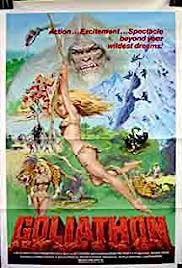

True label: ['Bertopic_27']
Predicted label: ['Bertopic_27']


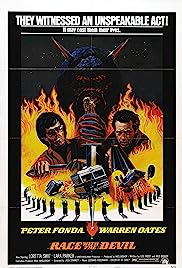

True label: ['Bertopic_25']
Predicted label: ['Bertopic_25']


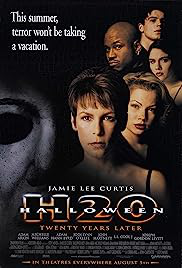

True label: ['Bertopic_20']
Predicted label: ['Bertopic_20']


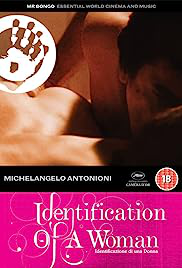

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


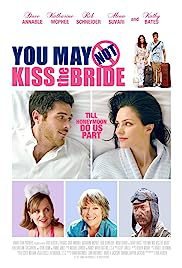

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


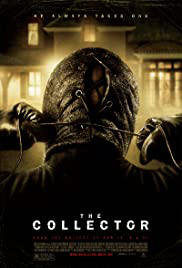

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


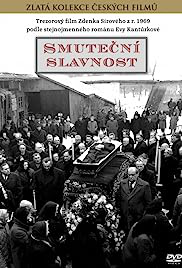

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


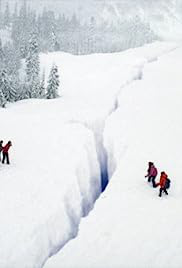

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


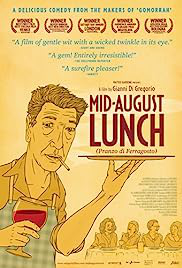

True label: ['Bertopic_14']
Predicted label: ['Bertopic_14']


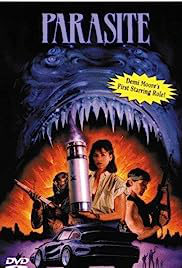

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


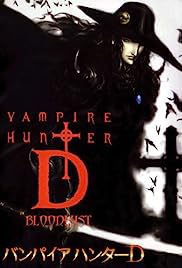

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


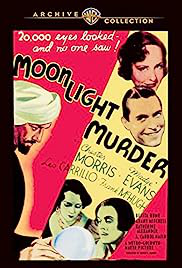

True label: ['Bertopic_2']
Predicted label: ['Bertopic_2']


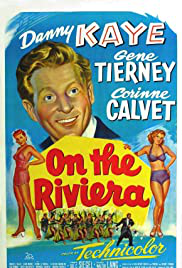

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


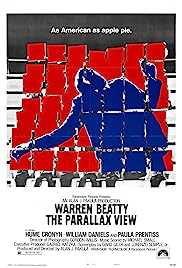

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


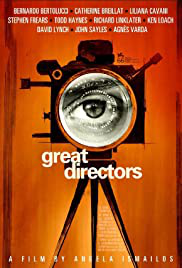

True label: ['Bertopic_13']
Predicted label: ['Bertopic_13']


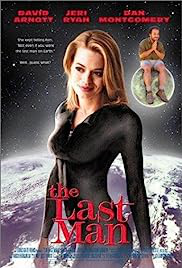

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


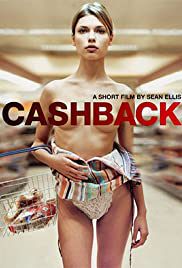

True label: ['Bertopic_5']
Predicted label: ['Bertopic_5']


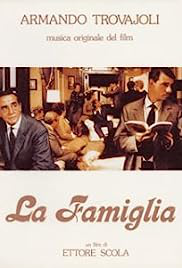

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


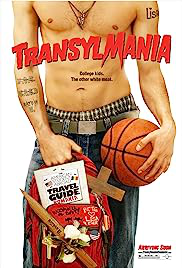

True label: ['Bertopic_10']
Predicted label: ['Bertopic_10']


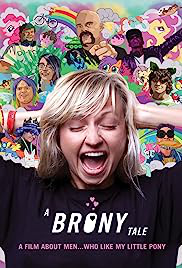

True label: ['Bertopic_16']
Predicted label: ['Bertopic_16']


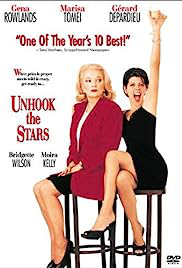

True label: ['Bertopic_32']
Predicted label: ['Bertopic_32']


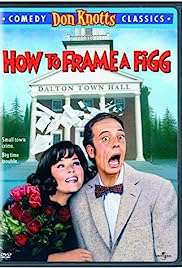

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


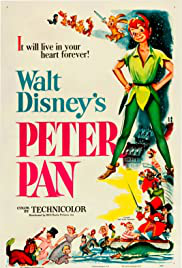

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


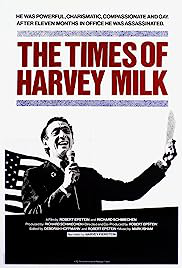

True label: ['Bertopic_29']
Predicted label: ['Bertopic_29']


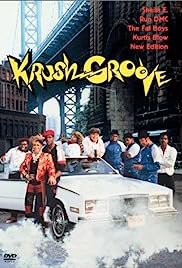

True label: ['Bertopic_34']
Predicted label: ['Bertopic_34']


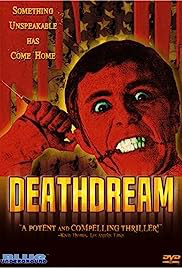

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


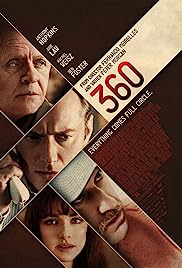

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


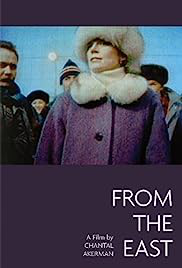

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


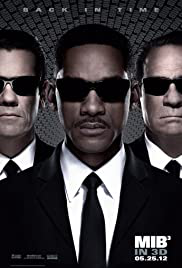

True label: ['Bertopic_39']
Predicted label: ['Bertopic_39']


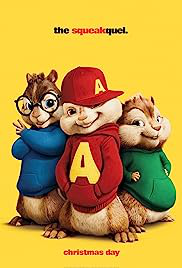

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


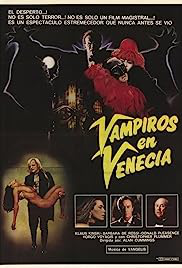

True label: ['Bertopic_29']
Predicted label: ['Bertopic_29']


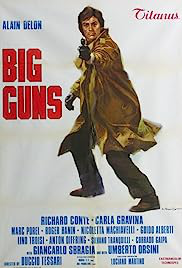

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


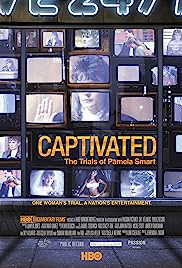

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


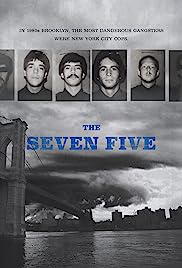

True label: ['Bertopic_10']
Predicted label: ['Bertopic_10']


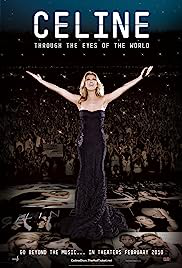

True label: ['Bertopic_7']
Predicted label: ['Bertopic_7']


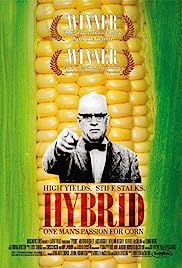

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


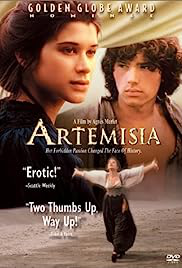

True label: ['Bertopic_29']
Predicted label: ['Bertopic_29']


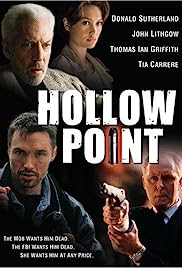

True label: ['Bertopic_3']
Predicted label: ['Bertopic_3']


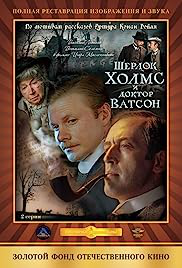

True label: ['Bertopic_2']
Predicted label: ['Bertopic_2']


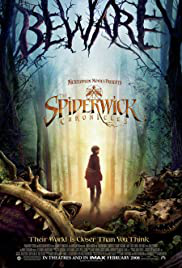

True label: ['Bertopic_1']
Predicted label: ['Bertopic_1']


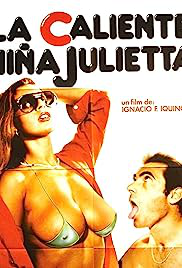

True label: ['Bertopic_2']
Predicted label: ['Bertopic_2']


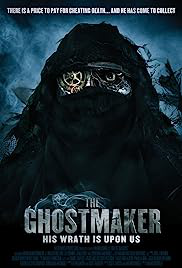

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


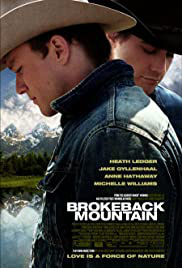

True label: ['Bertopic_16']
Predicted label: ['Bertopic_16']


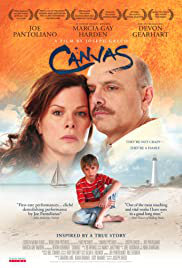

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


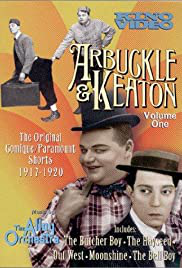

True label: ['Bertopic_29']
Predicted label: ['Bertopic_29']


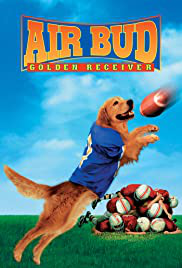

True label: ['Bertopic_7']
Predicted label: ['Bertopic_7']


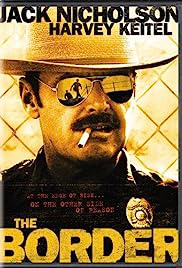

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


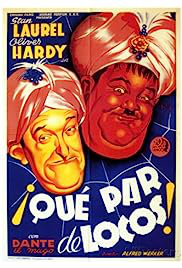

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


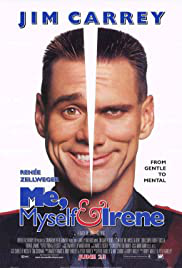

True label: ['Bertopic_2']
Predicted label: ['Bertopic_2']


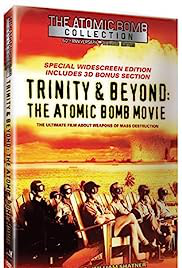

In [24]:
# Separate correct and incorrect predictions
correct_predictions = results_df[results_df.apply(lambda x: set(x['true_label']) == set(x['predicted_label']), axis=1)]
incorrect_predictions = results_df[results_df.apply(lambda x: set(x['true_label']) != set(x['predicted_label']), axis=1)]

# Display 5 correct predictions
print("Correct Predictions:")
for i, row in correct_predictions.head(50).iterrows():
    print(f"True label: {row['true_label']}")
    print(f"Predicted label: {row['predicted_label']}")
    img = Image.open(row['image_path'])
    display(img)

Incorrect Predictions:
True label: ['Bertopic_0']
Predicted label: []


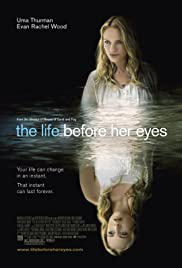

True label: ['Bertopic_11']
Predicted label: []


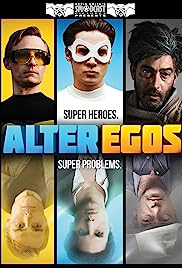

True label: ['Bertopic_13']
Predicted label: ['Bertopic_0']


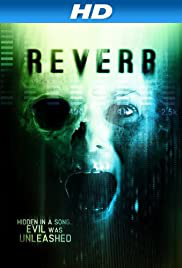

True label: ['Bertopic_7']
Predicted label: []


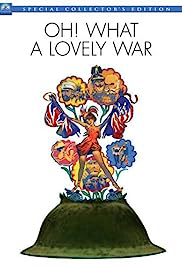

True label: ['Bertopic_7']
Predicted label: []


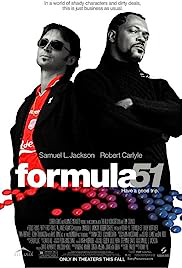

In [25]:
# Display 5 incorrect predictions
print("Incorrect Predictions:")
for i, row in incorrect_predictions.head(5).iterrows():
    print(f"True label: {row['true_label']}")
    print(f"Predicted label: {row['predicted_label']}")
    img = Image.open(row['image_path'])
    display(img)

In [26]:
# Add 'Prediction_Correct' column
results_df['Prediction_Correct'] = results_df.apply(lambda x: set(x['true_label']) == set(x['predicted_label']), axis=1)

# Now, merge this dataframe with your original posters_df to get the IMDB Score for each movie
merged_df = pd.merge(posters_df, results_df[['image_path', 'Prediction_Correct']], left_on='Poster_File_Path', right_on='image_path', how='inner')

# Create two dataframes: one for correct predictions and one for incorrect predictions
correct_preds = merged_df[merged_df['Prediction_Correct'] == True]
incorrect_preds = merged_df[merged_df['Prediction_Correct'] == False]

# Compute the average IMDB score for each
avg_correct_score = correct_preds['IMDB Score'].mean()
avg_incorrect_score = incorrect_preds['IMDB Score'].mean()

print(f"Average IMDB score for correct predictions: {avg_correct_score}")
print(f"Average IMDB score for incorrect predictions: {avg_incorrect_score}")


Average IMDB score for correct predictions: 6.517377049180327
Average IMDB score for incorrect predictions: 6.463469827586207


In [27]:
merged_df

,Title,IMDB Score,Genre,Release Year,Poster_File_Path,image_path,Prediction_Correct
0,Heat,8.2,Action|Crime|Drama,1995,posters_images/5.jpg,posters_images/5.jpg,False
1,Get Shorty,6.9,Comedy|Crime|Thriller,1995,posters_images/20.jpg,posters_images/20.jpg,False
2,Clueless,6.8,Comedy|Romance,1995,posters_images/38.jpg,posters_images/38.jpg,True
3,Richard III,7.5,Drama|War,1995,posters_images/40.jpg,posters_images/40.jpg,False
4,Bed of Roses,6.1,Romance|Drama,1996,posters_images/73.jpg,posters_images/73.jpg,False
...,...,...,...,...,...,...,...
1228,Special Correspondents,5.8,Comedy,2016,posters_images/37799.jpg,posters_images/37799.jpg,True
1229,How to Frame a Figg,6.6,Comedy,1971,posters_images/37834.jpg,posters_images/37834.jpg,False
1230,The Nice Guys,7.4,Action|Comedy|Crime,2016,posters_images/37964.jpg,posters_images/37964.jpg,True
1231,Pollyanna,7.5,Drama|Family,2003,posters_images/38243.jpg,posters_images/38243.jpg,True


# Forcing predictions
Runs through the test set again, gets the highest likelyhood prediction for each BERTopic

In [28]:
# Switch the model to evaluation mode
model.eval()

test_running_loss = 0.0
test_pbar = tqdm(test_loader, total=len(test_loader))

correct = 0
total = 0

# Save the image file names and their true and predicted labels
results = []

for i, (inputs, labels, image_paths) in enumerate(test_pbar):  
    outputs = model(inputs)  # Forward pass
    _, predicted_top1 = outputs.topk(1, 1)  # Get top 1 predicted label
    predicted = torch.zeros_like(outputs).scatter_(1, predicted_top1, 1)  # Create a binary mask for top 1 label
    
    loss = criterion(outputs, labels)  # Compute validation loss
    test_running_loss += loss.item()
    
    # Compute accuracy for the top label
    total += labels.size(0)
    correct += ((predicted * labels) > 0).sum().item()  # Count only correct labels

    # Append the image file names and their true and predicted labels to results
    for j in range(len(image_paths)):
        results.append({
            "image_path": image_paths[j],
            "true_label": labels[j].tolist(),
            "predicted_label": predicted[j].tolist()
        })

    # Update the progress bar description
    test_pbar.set_description(f"Test | Batch: {i+1} | Avg Batch Loss: {test_running_loss/(i+1)}")

num_topics = len(dataset.relevant_cols)  # Total count of topics
accuracy = correct / total  # Accuracy computed for the top predicted topic
print(f'Top-1 accuracy of the CNN on the test images: {100 * accuracy}%')

print(f"Test completed. Total loss: {test_running_loss}.")

# Switch the model back to training mode
model.train()

topic_index_to_name = {i: 'Bertopic_' + str(i) for i in range(num_topics)}

# Create a DataFrame from results
results_df = pd.DataFrame(results)

# Map 1s and 0s in true_label and predicted_label to corresponding topic names
results_df['true_label'] = results_df['true_label'].apply(lambda x: [topic_index_to_name[i] for i, label in enumerate(x) if label == 1])
results_df['predicted_label'] = results_df['predicted_label'].apply(lambda x: [topic_index_to_name[i] for i, label in enumerate(x) if label == 1])

# Display the DataFrame
print(results_df.head())

Test | Batch: 20 | Avg Batch Loss: 0.15153213515877723: 100%|██████████████████████████| 20/20 [01:14<00:00,  3.71s/it]

Top-1 accuracy of the CNN on the test images: 38.929440389294406%
Test completed. Total loss: 3.0306427031755447.
                 image_path     true_label predicted_label
0  posters_images/12497.jpg   [Bertopic_0]    [Bertopic_0]
1  posters_images/23552.jpg  [Bertopic_11]    [Bertopic_2]
2  posters_images/36426.jpg  [Bertopic_13]    [Bertopic_0]
3   posters_images/2486.jpg   [Bertopic_0]    [Bertopic_0]
4  posters_images/13448.jpg   [Bertopic_7]    [Bertopic_2]


In [29]:
# Filter rows where predicted_label is not empty
non_empty_rows = results_df[results_df['predicted_label'].astype(bool)]

# Print the filtered DataFrame
print(non_empty_rows)

                    image_path     true_label predicted_label
0     posters_images/12497.jpg   [Bertopic_0]    [Bertopic_0]
1     posters_images/23552.jpg  [Bertopic_11]    [Bertopic_2]
2     posters_images/36426.jpg  [Bertopic_13]    [Bertopic_0]
3      posters_images/2486.jpg   [Bertopic_0]    [Bertopic_0]
4     posters_images/13448.jpg   [Bertopic_7]    [Bertopic_2]
...                        ...            ...             ...
1228  posters_images/25216.jpg  [Bertopic_29]    [Bertopic_0]
1229  posters_images/19419.jpg   [Bertopic_0]    [Bertopic_0]
1230  posters_images/15063.jpg  [Bertopic_39]   [Bertopic_39]
1231  posters_images/31500.jpg   [Bertopic_3]    [Bertopic_0]
1232    posters_images/357.jpg  [Bertopic_29]    [Bertopic_0]

[1233 rows x 3 columns]


In [30]:
results_df

,image_path,true_label,predicted_label
0,posters_images/12497.jpg,[Bertopic_0],[Bertopic_0]
1,posters_images/23552.jpg,[Bertopic_11],[Bertopic_2]
2,posters_images/36426.jpg,[Bertopic_13],[Bertopic_0]
3,posters_images/2486.jpg,[Bertopic_0],[Bertopic_0]
4,posters_images/13448.jpg,[Bertopic_7],[Bertopic_2]
...,...,...,...
1228,posters_images/25216.jpg,[Bertopic_29],[Bertopic_0]
1229,posters_images/19419.jpg,[Bertopic_0],[Bertopic_0]
1230,posters_images/15063.jpg,[Bertopic_39],[Bertopic_39]
1231,posters_images/31500.jpg,[Bertopic_3],[Bertopic_0]


# EDA

Correct Predictions:
True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


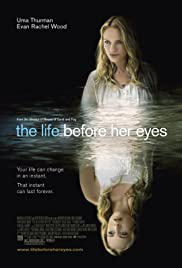

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


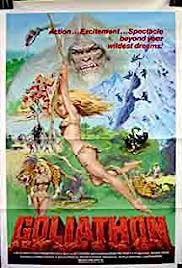

True label: ['Bertopic_27']
Predicted label: ['Bertopic_27']


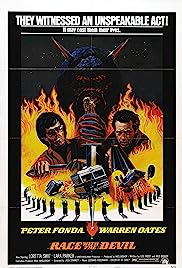

True label: ['Bertopic_25']
Predicted label: ['Bertopic_25']


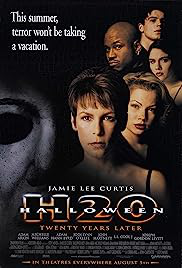

True label: ['Bertopic_20']
Predicted label: ['Bertopic_20']


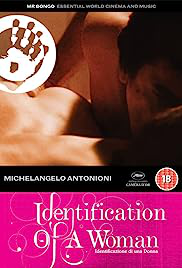

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


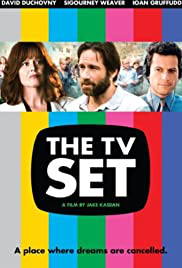

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


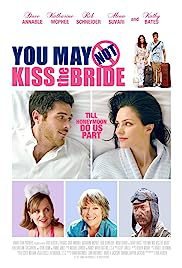

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


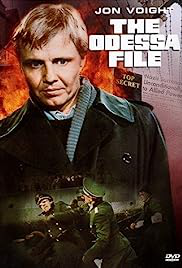

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


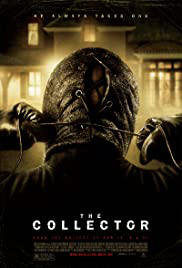

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


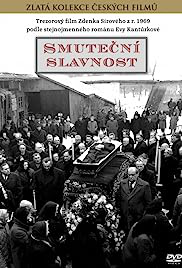

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


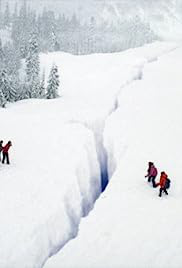

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


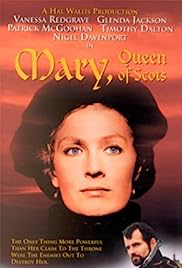

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


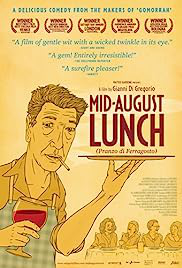

True label: ['Bertopic_14']
Predicted label: ['Bertopic_14']


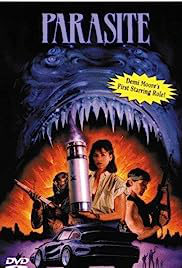

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


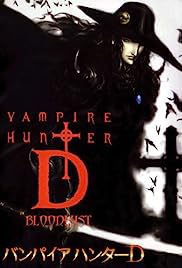

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


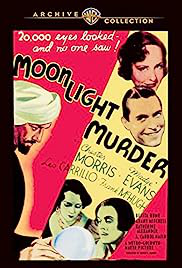

True label: ['Bertopic_2']
Predicted label: ['Bertopic_2']


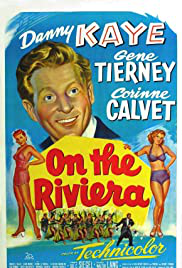

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


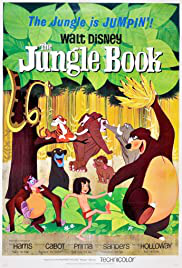

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


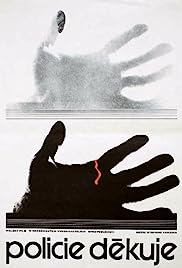

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


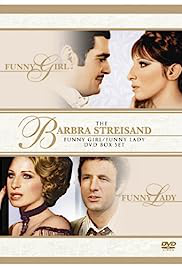

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


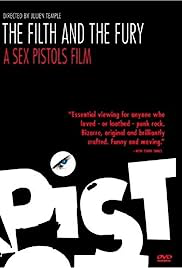

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


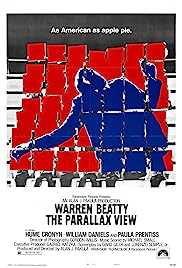

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


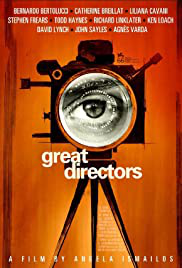

True label: ['Bertopic_13']
Predicted label: ['Bertopic_13']


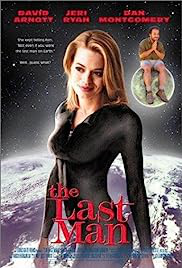

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


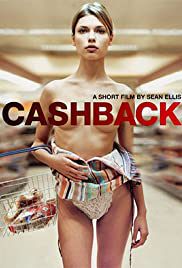

True label: ['Bertopic_5']
Predicted label: ['Bertopic_5']


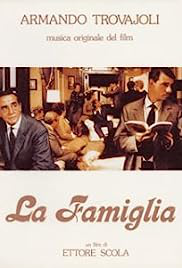

True label: ['Bertopic_4']
Predicted label: ['Bertopic_4']


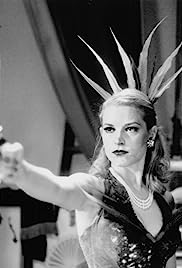

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


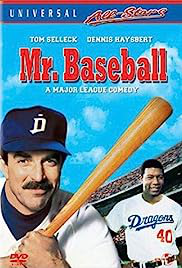

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


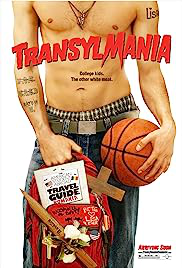

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


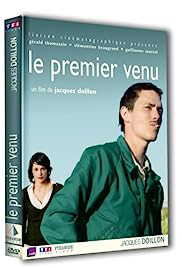

True label: ['Bertopic_10']
Predicted label: ['Bertopic_10']


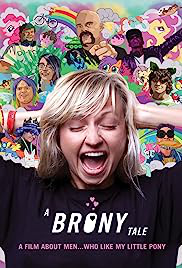

True label: ['Bertopic_16']
Predicted label: ['Bertopic_16']


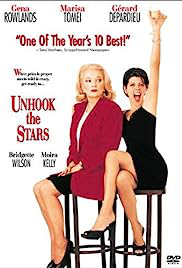

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


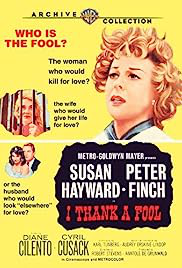

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


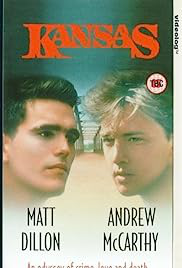

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


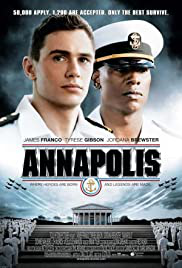

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


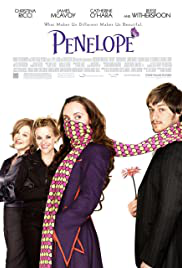

True label: ['Bertopic_32']
Predicted label: ['Bertopic_32']


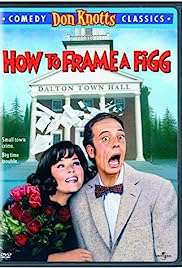

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


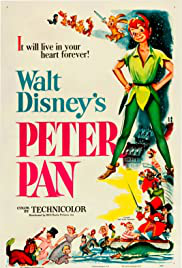

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


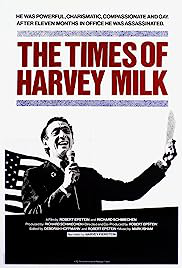

True label: ['Bertopic_29']
Predicted label: ['Bertopic_29']


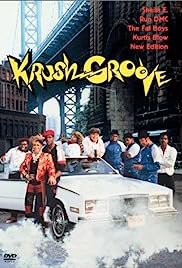

True label: ['Bertopic_34']
Predicted label: ['Bertopic_34']


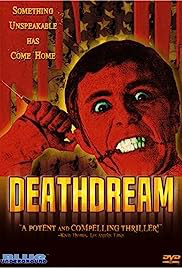

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


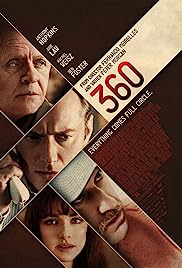

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


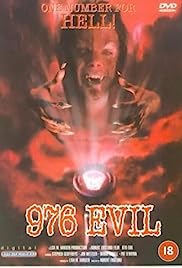

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


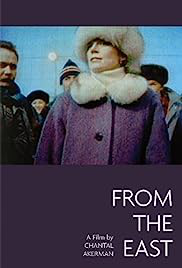

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


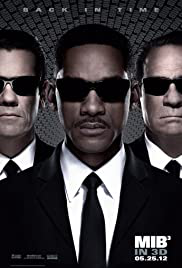

True label: ['Bertopic_39']
Predicted label: ['Bertopic_39']


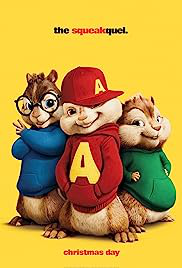

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


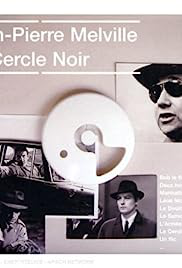

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


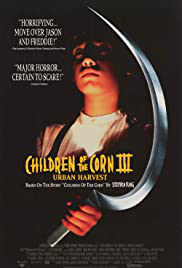

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


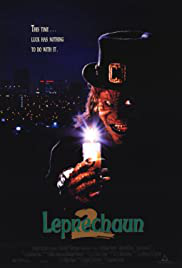

True label: ['Bertopic_0']
Predicted label: ['Bertopic_0']


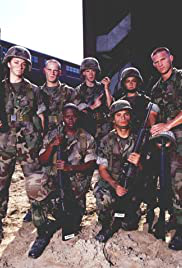

In [31]:
# Separate correct and incorrect predictions
correct_predictions = results_df[results_df.apply(lambda x: set(x['predicted_label']).issubset(set(x['true_label'])), axis=1)]
incorrect_predictions = results_df[results_df.apply(lambda x: not set(x['predicted_label']).issubset(set(x['true_label'])), axis=1)]

# Display 5 correct predictions
print("Correct Predictions:")
for i, row in correct_predictions.head(50).iterrows():
    print(f"True label: {row['true_label']}")
    print(f"Predicted label: {row['predicted_label']}")
    img = Image.open(row['image_path'])
    display(img)

Incorrect Predictions:
True label: ['Bertopic_11']
Predicted label: ['Bertopic_2']


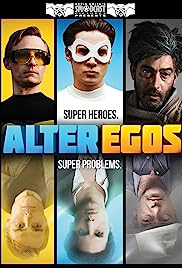

True label: ['Bertopic_13']
Predicted label: ['Bertopic_0']


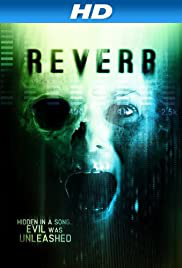

True label: ['Bertopic_7']
Predicted label: ['Bertopic_2']


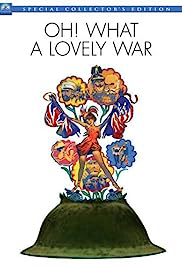

True label: ['Bertopic_7']
Predicted label: ['Bertopic_0']


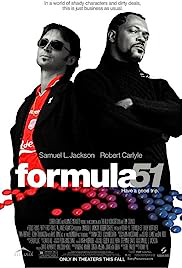

True label: ['Bertopic_6']
Predicted label: ['Bertopic_0']


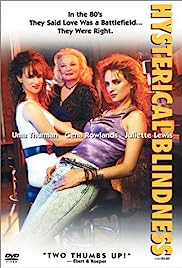

In [32]:
# Display 5 incorrect predictions
print("Incorrect Predictions:")
for i, row in incorrect_predictions.head(5).iterrows():
    print(f"True label: {row['true_label']}")
    print(f"Predicted label: {row['predicted_label']}")
    img = Image.open(row['image_path'])
    display(img)

In [34]:
# Merge results_df and merged_df to add IMDB score onto results_df
final_df = pd.merge(results_df, merged_df[['Poster_File_Path', 'IMDB Score']], left_on='image_path', right_on='Poster_File_Path', how='inner')

# Drop the duplicate 'Poster_File_Path' column
final_df = final_df.drop(columns=['Poster_File_Path'])

# Display the final_df
print(final_df.head(5))

                 image_path     true_label predicted_label  \
0  posters_images/12497.jpg   [Bertopic_0]    [Bertopic_0]   
1  posters_images/23552.jpg  [Bertopic_11]    [Bertopic_2]   
2  posters_images/36426.jpg  [Bertopic_13]    [Bertopic_0]   
3   posters_images/2486.jpg   [Bertopic_0]    [Bertopic_0]   
4  posters_images/13448.jpg   [Bertopic_7]    [Bertopic_2]   

   Prediction_Correct  IMDB Score  
0                True         6.8  
1               False         6.6  
2               False         8.6  
3                True         6.6  
4               False         5.9  


In [35]:
# Add 'Prediction_Correct' column
results_df['Prediction_Correct'] = results_df.apply(lambda x: set(x['predicted_label']).issubset(set(x['true_label'])), axis=1)

# Now, merge with posters_df to get the IMDB Score for each movie back
final__df = pd.merge(posters_df, results_df[['image_path', 'Prediction_Correct']], left_on='Poster_File_Path', right_on='image_path', how='inner')

# Create two dataframes: one for correct predictions and one for incorrect predictions
correct_preds = final_df[final_df['Prediction_Correct'] == True]
incorrect_preds = final_df[final_df['Prediction_Correct'] == False]

# Compute the average IMDB score for each
avg_correct_score = correct_preds['IMDB Score'].mean()
avg_incorrect_score = incorrect_preds['IMDB Score'].mean()

print(f"Average IMDB score for correct predictions: {avg_correct_score}")
print(f"Average IMDB score for incorrect predictions: {avg_incorrect_score}")

Average IMDB score for correct predictions: 6.560107334525939
Average IMDB score for incorrect predictions: 6.472448979591836


In [36]:
results_df

,image_path,true_label,predicted_label,Prediction_Correct
0,posters_images/12497.jpg,[Bertopic_0],[Bertopic_0],True
1,posters_images/23552.jpg,[Bertopic_11],[Bertopic_2],False
2,posters_images/36426.jpg,[Bertopic_13],[Bertopic_0],False
3,posters_images/2486.jpg,[Bertopic_0],[Bertopic_0],True
4,posters_images/13448.jpg,[Bertopic_7],[Bertopic_2],False
...,...,...,...,...
1228,posters_images/25216.jpg,[Bertopic_29],[Bertopic_0],False
1229,posters_images/19419.jpg,[Bertopic_0],[Bertopic_0],True
1230,posters_images/15063.jpg,[Bertopic_39],[Bertopic_39],True
1231,posters_images/31500.jpg,[Bertopic_3],[Bertopic_0],False


In [37]:
results_df['Prediction_Correct'].value_counts()

False    753
True     480
Name: Prediction_Correct, dtype: int64

# Testing statistical difference between the two groups:

In [38]:
# Perform t-test
t_stat, p_value = stats.ttest_ind(correct_preds['IMDB Score'], incorrect_preds['IMDB Score'])

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

T-statistic: 1.5565164618584724
P-value: 0.11982128879652984
